## 1.0 Getting The Project Data

In [1]:
# import necessary libraries
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import os, random
from tensorflow.keras import Sequential, Model, Input
from tensorflow.keras.layers import Conv2D, MaxPool2D, InputLayer, Dense, Flatten, Activation, Dropout, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import image_dataset_from_directory

There are 3 methods of acquiring the dataset:

1st Method: Mounting my google drive into goole colab and unzipping the dataset.
2nd Method: Using the API command from the roboflow project site
3rd Method: Copying the dataset URL from the Github repository, downloading and extracting the contents of the zip file into colab.

## 2.0 Inspect the data


In [2]:
# list the files of solar panels classes
!dir C:\Users\Emad\Desktop\the_last_pro\solar_pv_dataset

 Volume in drive C has no label.
 Volume Serial Number is 6AE5-43AB

 Directory of C:\Users\Emad\Desktop\the_last_pro\solar_pv_dataset

03/16/2024  03:40 AM    <DIR>          .
09/30/2024  10:53 AM    <DIR>          ..
09/29/2024  06:08 PM    <DIR>          Bird dropping
09/29/2024  06:08 PM    <DIR>          Clean
09/29/2024  06:09 PM    <DIR>          Cracked
09/29/2024  06:09 PM    <DIR>          Damaged
09/29/2024  06:09 PM    <DIR>          Dusty
09/29/2024  06:10 PM    <DIR>          Snow
               0 File(s)              0 bytes
               8 Dir(s)  63,795,175,424 bytes free


In [3]:
import os

# walk through the solar thermal directory and list the number of images
for dirpath, dirnames, filenames in os.walk('solar_pv_dataset'):
  print(f'There are: {len(dirnames)} directories and {len(filenames)} images in {dirpath}')

There are: 6 directories and 0 images in solar_pv_dataset
There are: 0 directories and 190 images in solar_pv_dataset\Bird dropping
There are: 0 directories and 183 images in solar_pv_dataset\Clean
There are: 0 directories and 115 images in solar_pv_dataset\Cracked
There are: 0 directories and 133 images in solar_pv_dataset\Damaged
There are: 0 directories and 190 images in solar_pv_dataset\Dusty
There are: 0 directories and 123 images in solar_pv_dataset\Snow


In [4]:
# The file root directory of the solar panel classes
!dir /a C:\Users\Emad\Desktop\the_last_pro\solar_pv_dataset

 Volume in drive C has no label.
 Volume Serial Number is 6AE5-43AB

 Directory of C:\Users\Emad\Desktop\the_last_pro\solar_pv_dataset

03/16/2024  03:40 AM    <DIR>          .
09/30/2024  10:53 AM    <DIR>          ..
09/29/2024  06:08 PM    <DIR>          Bird dropping
09/29/2024  06:08 PM    <DIR>          Clean
09/29/2024  06:09 PM    <DIR>          Cracked
09/29/2024  06:09 PM    <DIR>          Damaged
09/29/2024  06:09 PM    <DIR>          Dusty
09/29/2024  06:10 PM    <DIR>          Snow
               0 File(s)              0 bytes
               8 Dir(s)  63,799,160,832 bytes free


To visualize our images, first let's get our class names programmatically.

In [5]:
# get the class names programmatically
import pathlib
import numpy as np

data_dir = pathlib.Path('C:/Users/Emad/Desktop/the_last_pro/solar_pv_dataset')   # set it as a path object
class_names = np.array(sorted([item.name for item in data_dir.glob('*')]))  # created a list of class names from the train sub directories
print(class_names)

['Bird dropping' 'Clean' 'Cracked' 'Damaged' 'Dusty' 'Snow']


In [6]:
# data path
data_path = 'solar_pv_dataset'

# set the total number of images
total_images = 0

# go through the class name
for class_name in class_names:
  target_folder = data_path + '/' + class_name # target folder = 'solar_pv_dataset/bird dropping'
  total_images += len((os.listdir(target_folder)))

print(f'There are total number of {total_images} images in our solar pv dataset.')

There are total number of 934 images in our solar pv dataset.


In [7]:
# create a function to view random images
def view_random_image(target_dir, target_class = random.choice(class_names)):
  '''
  Views a random image from the target directory of the target class (Clean, Crack, Dirty, Bird dropping)
  '''

  # Visualize images from the train data
  import matplotlib.pyplot as plt
  import matplotlib.image as mpimg    # import matplotlib module to work with images
  import random, os

  # Setup target directory
  target_folder = target_dir + target_class   # target folder will be "solar_panels_classes/train" + "Clean" (or Damaged or Dirty)

  # get a random image path
  random_image = random.sample(os.listdir(target_folder), 1)    # gets 1 random sample image from the list of files in target folder
  print(random_image)

  # Read in the image and plot it using matplotlib
  image = mpimg.imread(target_folder + '/' + random_image[0])   # reads the first element from the random selected target folder. Rmoves the [] in ['20170818_105127_jpg.rf.670a60792f66c43d4644ee469b6c2f3b.jpg']
  plt.imshow(image)
  plt.title(target_class)
  plt.axis('Off');

  print(f'Image shape: {image.shape}')   # show the shape of the image

  return image

['cracked (22).jpg']
Image shape: (231, 474, 3)


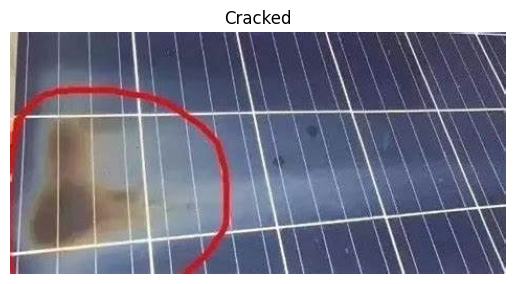

In [8]:
# view a random image
image = view_random_image(target_dir = "C:/Users/Emad/Desktop/the_last_pro/solar_pv_dataset/",
                          target_class = random.choice(class_names))

In [9]:
import tensorflow as tf
tf.constant(image)

<tf.Tensor: shape=(231, 474, 3), dtype=uint8, numpy=
array([[[207, 195, 171],
        [204, 192, 168],
        [190, 177, 158],
        ...,
        [ 89,  87, 109],
        [ 83,  81, 103],
        [ 83,  81, 103]],

       [[206, 194, 170],
        [204, 192, 168],
        [191, 178, 159],
        ...,
        [ 89,  87, 109],
        [ 85,  83, 105],
        [ 85,  83, 105]],

       [[206, 194, 170],
        [205, 193, 169],
        [192, 179, 160],
        ...,
        [211, 209, 231],
        [206, 204, 226],
        [206, 204, 226]],

       ...,

       [[185,  44,  63],
        [172,  39,  58],
        [153,  36,  54],
        ...,
        [ 96, 100, 125],
        [204, 209, 231],
        [229, 234, 255]],

       [[193,  52,  71],
        [175,  42,  61],
        [157,  40,  58],
        ...,
        [ 73,  77, 102],
        [184, 189, 211],
        [221, 226, 248]],

       [[199,  58,  77],
        [177,  44,  63],
        [160,  43,  61],
        ...,
        [ 72,  76, 10

In [10]:
# Get number of dimensions
image.ndim

3

In [11]:
# View image shape
image.shape # returns width, height, color channels

(231, 474, 3)

In [12]:
# normalize image value between 0 and 1 by dividing it by 255
image/ 255.

array([[[0.81176471, 0.76470588, 0.67058824],
        [0.8       , 0.75294118, 0.65882353],
        [0.74509804, 0.69411765, 0.61960784],
        ...,
        [0.34901961, 0.34117647, 0.42745098],
        [0.3254902 , 0.31764706, 0.40392157],
        [0.3254902 , 0.31764706, 0.40392157]],

       [[0.80784314, 0.76078431, 0.66666667],
        [0.8       , 0.75294118, 0.65882353],
        [0.74901961, 0.69803922, 0.62352941],
        ...,
        [0.34901961, 0.34117647, 0.42745098],
        [0.33333333, 0.3254902 , 0.41176471],
        [0.33333333, 0.3254902 , 0.41176471]],

       [[0.80784314, 0.76078431, 0.66666667],
        [0.80392157, 0.75686275, 0.6627451 ],
        [0.75294118, 0.70196078, 0.62745098],
        ...,
        [0.82745098, 0.81960784, 0.90588235],
        [0.80784314, 0.8       , 0.88627451],
        [0.80784314, 0.8       , 0.88627451]],

       ...,

       [[0.7254902 , 0.17254902, 0.24705882],
        [0.6745098 , 0.15294118, 0.22745098],
        [0.6       , 0

## 3.0 Data Preprocessing ⚙️

In [16]:
# install split folders
#!pip install split_folders

# import split folders
import splitfolders

# define the input and output folders
input_folder = 'solar_pv_dataset'
output_folder = 'data_splitted'

# split the data
splitfolders.ratio(input_folder, output_folder, seed = 42, ratio = (0.7, 0.3))

Copying files: 0 files [00:00, ? files/s]

Copying files: 934 files [00:02, 361.23 files/s]


In [13]:
# import tensorflow and the necessary functions
import tensorflow as tf

# setup data path, image, and batch size
train_data_path = 'data_splitted/train'
valid_data_path = 'data_splitted/val'

IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# create train data and valid data
train_data = tf.keras.preprocessing.image_dataset_from_directory(
    directory = train_data_path,
    image_size = IMG_SIZE,
    batch_size = BATCH_SIZE,
    shuffle = True,
    seed = 42,
    label_mode = 'categorical',
    interpolation = 'bilinear',
    color_mode = 'rgb'
)

valid_data = tf.keras.preprocessing.image_dataset_from_directory(
    directory = valid_data_path,
    image_size = IMG_SIZE,
    batch_size = BATCH_SIZE,
    seed = 42,
    shuffle = False,
    label_mode = 'categorical',
    interpolation = 'bilinear',
    color_mode = 'rgb'
)

train_data, valid_data

Found 653 files belonging to 6 classes.
Found 281 files belonging to 6 classes.


(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 6), dtype=tf.float32, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 6), dtype=tf.float32, name=None))>)

In [14]:
# view the images and label lengths
image, labels = train_data.take(2) # get the 'next' batch of the train data images and labels

len(image), len(labels)

(2, 2)

In [15]:
# get the first 2 images and see teh shape
image[:2], image[0].shape

((<tf.Tensor: shape=(32, 224, 224, 3), dtype=float32, numpy=
  array([[[[ 67.625    ,  97.625    , 170.42387  ],
           [ 76.157684 , 104.71125  , 176.05054  ],
           [ 86.97649  , 115.97649  , 183.30031  ],
           ...,
           [ 35.926502 ,  69.926506 , 141.9265   ],
           [ 35.07373  ,  69.07373  , 141.07373  ],
           [ 33.280766 ,  67.28076  , 139.28076  ]],
  
          [[ 84.48302  , 113.08051  , 183.95767  ],
           [ 88.35499  , 117.35499  , 185.91748  ],
           [ 94.64373  , 124.30086  , 188.79193  ],
           ...,
           [ 35.28743  ,  69.35528  , 140.15175  ],
           [ 35.04897  ,  69.12271  , 139.90149  ],
           [ 39.44792  ,  73.527565 , 144.28864  ]],
  
          [[ 70.58124  ,  98.18511  , 164.26755  ],
           [ 66.85005  ,  96.792015 , 159.917    ],
           [ 78.689095 , 108.689095 , 169.6266   ],
           ...,
           [ 91.16812  , 124.25     , 192.52075  ],
           [ 91.70625  , 124.79021  , 192.98749  ],

In [16]:
# view the first batch of labels
labels

(<tf.Tensor: shape=(32, 224, 224, 3), dtype=float32, numpy=
 array([[[[147.0284  , 189.33197 , 228.88678 ],
          [147.77713 , 189.85934 , 228.81877 ],
          [200.54207 , 220.80855 , 243.5431  ],
          ...,
          [177.96652 , 213.96652 , 239.96652 ],
          [178.      , 214.      , 240.      ],
          [178.      , 214.      , 238.      ]],
 
         [[148.76302 , 191.74777 , 233.71729 ],
          [197.43982 , 223.64072 , 241.0972  ],
          [152.41287 , 186.07101 , 216.93364 ],
          ...,
          [178.      , 214.      , 240.      ],
          [177.      , 213.      , 239.      ],
          [178.      , 214.      , 238.      ]],
 
         [[156.4648  , 188.90898 , 219.17598 ],
          [194.53781 , 222.59328 , 244.54262 ],
          [147.      , 190.36812 , 231.26375 ],
          ...,
          [178.      , 214.      , 240.      ],
          [178.45544 , 214.45544 , 240.45544 ],
          [179.      , 215.      , 239.      ]],
 
         ...,
 
      

Let's calculate the class weights and the importance of each class compared to other classes to understnad which classes are the minority.

In [17]:
from sklearn.utils.class_weight import compute_class_weight

# You need to convert the class names to numeric labels if they are strings
class_names = train_data.class_names
class_labels = np.unique(train_data.class_names, return_inverse=True)[1]

# get the class_weights
class_weights = compute_class_weight('balanced', classes = np.unique(class_labels), y = class_labels)

class_weight = dict(enumerate(class_weights))
class_weight, class_names

({0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0, 4: 1.0, 5: 1.0},
 ['Bird dropping', 'Clean', 'Cracked', 'Damaged', 'Dusty', 'Snow'])

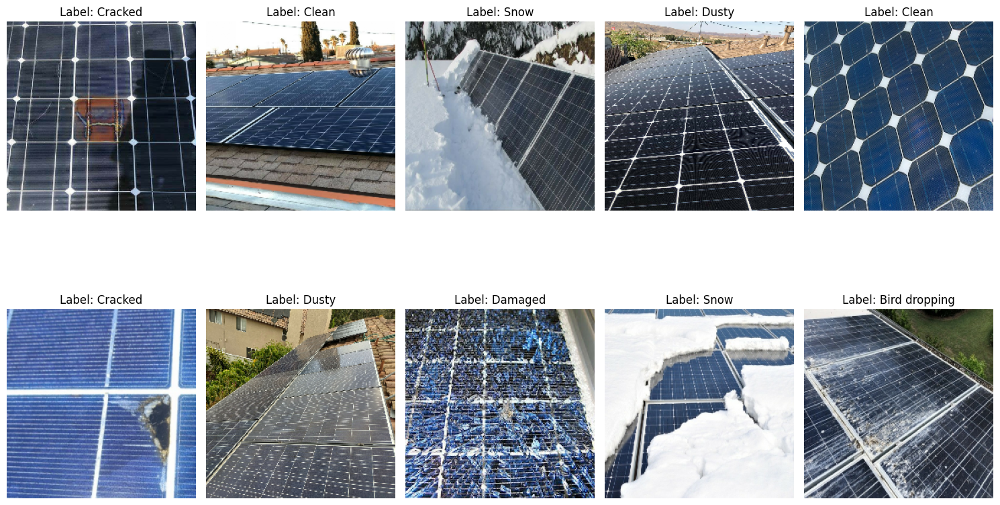

In [18]:
import matplotlib.pyplot as plt

# Fetch the images and labels from the train data
images, labels = next(iter(train_data.batch(10)))

# setup figure
plt.figure(figsize=(15, 10))

# loop through the number of samples
for i in range(10):

  # create a subplot
  plt.subplot(2, 5, i + 1)
  plt.imshow(images[i][0] / 255.)
  plt.title(f'Label: {class_names[labels[i].numpy().argmax()]}')
  plt.axis(False)

plt.tight_layout()
plt.show()

## 4.0 Build a Deep Learning CNN Model 🤖💻

### 4.1 Using Transfer Learning for our problem Part 1: Feature Extraction

In [19]:
# check GPU info
!nvidia-smi

Tue Oct  1 05:48:04 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 553.09                 Driver Version: 553.09         CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Quadro M1000M                WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A    0C    P8             N/A /  200W |       0MiB /   2048MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

#### 4.1.1 Importing Helper Functions

In [20]:

# Import helper functions I am going to use
from helper_functions import create_callbacks, view_loss_accuracy, pred_and_plot, view_random_image

#### 4.2.2 Setting up callbacks (things to run whilst our model trains)

In [21]:
def create_callbacks(dir_name, experiment_name):
  '''
  Creates a tensorboard callback, earlystoppingcallback, model checkpoint, and learning rate scheduler
  '''

  import datetime
  import tensorflow as tf
  import os

  # create a directory to store the experiments of the models as logs with the current date and time
  log_dir = dir_name + "/" + experiment_name + "/" + datetime.datetime.now().strftime('%Y%m%d-%H%M%S')
  tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = log_dir)
  print(f'Saving TensorBoard Log Files to: {log_dir}')

  # use the earlystoppingcallback
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=1e-2, patience=3, verbose=1, restore_best_weights=True)

  # create the model checkpoint
  model_checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = os.path.join(dir_name, experiment_name),
                                                        monitor = 'val_loss',
                                                        verbose = 0,
                                                        mode = 'min',
                                                        save_weights_only = True,
                                                        save_best_only = False)

  # create a scheduler function to take the current learing rate and improve it
  def scheduler(epoch, lr):
    if epoch < 10:
      return lr
    else:
      return lr * tf.math.exp(-0.1)

  # call the learning rate method
  learning_rate = tf.keras.callbacks.LearningRateScheduler(scheduler) # calls the scheduler function

  return tensorboard_callback, early_stopping, model_checkpoint, learning_rate

#### 4.2.3 Building EfficientNet Feature Extraction Model using the Keras Functional API


In [22]:
# import library
import tensorflow as tf
from tensorflow.keras.applications.efficientnet import EfficientNetB0
from tensorflow.keras import layers

# setup random seed
tf.random.set_seed(42)

# setup image shape
IMG_SIZE = (224, 224)

# 1. Create the base model with tf.keras.applications
efficientnetb0 = EfficientNetB0(include_top = False)

# 2. Freeze the base model (underlying pretrained patterns aren't updated during training)
efficientnetb0.trainable = False

# 3. Create inputs into our model
inputs = Input(shape = (IMG_SIZE +(3, )), name = 'input_layer')

# 4. If using a model like ResNet50V2 you will need to normalize inputs (you dont have to for EfficientNetB0)
# x = tf.keras.layers.experimental.preprocessing.Rescaling(1./255)(inputs)

# 5. Pass the inputs to the model
x = efficientnetb0(inputs)
print(f'Shape after passing inputs through efficientnetb0 model: {x.shape}')

# 6. Average pool the outputs of the baseline model (aggregate all of the most important information, reduce number of computations)
x = tf.keras.layers.GlobalAveragePooling2D(name = 'global_average_pooling_layer')(x)
print(f'Shape after global average pooling 2d: {x.shape}')

# 7. Create the output activation layer
outputs = tf.keras.layers.Dense(len(train_data.class_names), activation = 'softmax', name = 'output_layer')(x)
print(f'Shape after output layer: {outputs.shape}')

# 8. Combine the inputs with the outputs into a model
efficientnetb0_model = tf.keras.Model(inputs, outputs)

# 9. Compile the model
efficientnetb0_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),
                optimizer = tf.keras.optimizers.Adam(),
                metrics = ['accuracy'])

# 10. Fit the model
efficientnetb0_history = efficientnetb0_model.fit(train_data,
                                                  epochs = 10,
                                                  steps_per_epoch = len(train_data),
                                                  validation_data = valid_data,
                                                  callbacks = [create_callbacks(dir_name = 'transfer_learning',
                                                                                experiment_name = 'efficientnetb0_feature_extraction_model')])

Shape after passing inputs through efficientnetb0 model: (None, 7, 7, 1280)
Shape after global average pooling 2d: (None, 1280)
Shape after output layer: (None, 6)
Saving TensorBoard Log Files to: transfer_learning/efficientnetb0_feature_extraction_model/20241001-054836
Epoch 1/10
21/21 [==============================] - 70s 3s/step - loss: 1.5951 - accuracy: 0.3675 - val_loss: 1.3024 - val_accuracy: 0.5694 - lr: 0.0010
Epoch 2/10
21/21 [==============================] - 50s 2s/step - loss: 1.0896 - accuracy: 0.6876 - val_loss: 1.0296 - val_accuracy: 0.6762 - lr: 0.0010
Epoch 3/10
21/21 [==============================] - 53s 2s/step - loss: 0.8474 - accuracy: 0.7504 - val_loss: 0.9018 - val_accuracy: 0.7046 - lr: 0.0010
Epoch 4/10
21/21 [==============================] - 58s 3s/step - loss: 0.7226 - accuracy: 0.7871 - val_loss: 0.8288 - val_accuracy: 0.7189 - lr: 0.0010
Epoch 5/10
21/21 [==============================] - 54s 3s/step - loss: 0.6553 - accuracy: 0.7948 - val_loss: 0.7829 

In [23]:
efficientnetb0_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetb0 (Functional  (None, None, None, 1280   4049571   
 )                           )                                   
                                                                 
 global_average_pooling_lay  (None, 1280)              0         
 er (GlobalAveragePooling2D                                      
 )                                                               
                                                                 
 output_layer (Dense)        (None, 6)                 7686      
                                                                 
Total params: 4057257 (15.48 MB)
Trainable params: 7686 (30.02 KB)
Non-trainable params: 4049571 (15.45 MB)
___________________

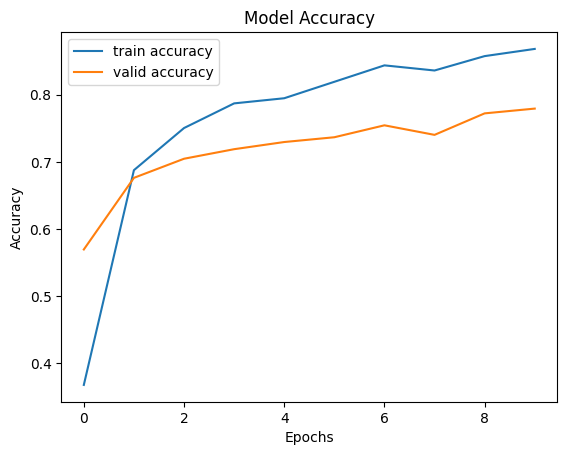

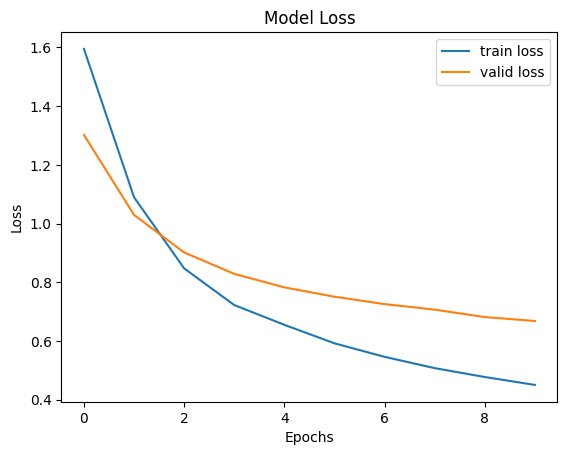

In [24]:
view_loss_accuracy(efficientnetb0_history)

##### 4.6.4.1 Applying Data Augmentation into the model

In [25]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.layers import RandomBrightness

# Define data augmentation layers using a Sequential model
data_augmentation = tf.keras.Sequential([
    preprocessing.RandomFlip("horizontal"),   # flips the image horizontally
    preprocessing.RandomRotation(0.3),        # rotates the image
    preprocessing.RandomZoom(0.3),            # zoom in on the image
    preprocessing.RandomHeight(0.3),          # changes the image height
    preprocessing.RandomWidth(0.3),           # changes the image width
    RandomBrightness(-0.3)                     # changes the brightness level of the image
], name = 'data_augmentation')
data_augmentation

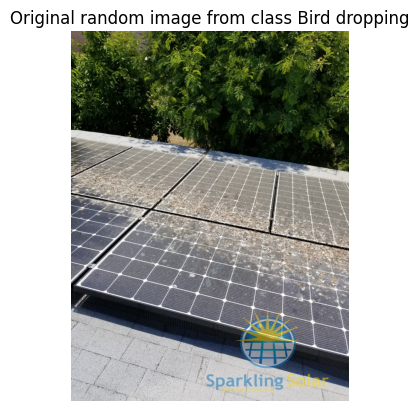

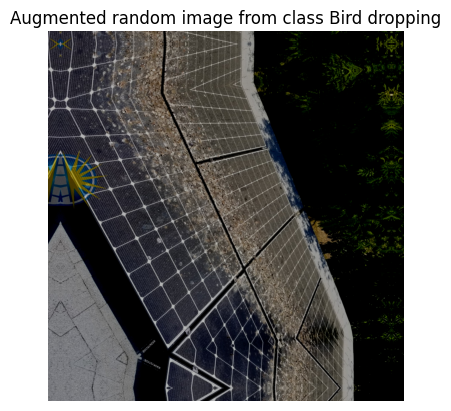

In [26]:
# lets visualize the image and compare it with the augmented image
import matplotlib.pyplot as plt
import random, os
import matplotlib.image as mpimg

# get the random target class
target_class = random.choice(train_data.class_names)

# get the target dir
target_dir = 'solar_pv_dataset' + '/' + target_class

# get a random image
random_image = random.choice(os.listdir(target_dir))

# get the random image path
random_image_path = target_dir + '/' + random_image

# view the random image
image = mpimg.imread(random_image_path)
plt.imshow(image);
plt.axis(False)
plt.title(f'Original random image from class {target_class}');

# view the augmented random image
augmented_image = data_augmentation(image)
plt.figure()
plt.imshow(augmented_image/255.);
plt.axis(False);
plt.title(f'Augmented random image from class {target_class}');

##### 4.6.4.2 Building EfficientNetB0 Feature Model with Data augmentation using Functional API

In [27]:
# import library
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications.efficientnet import EfficientNetB0
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D

# setup random seed
tf.random.set_seed(42)

# setup input shape
input_shape = (224, 224, 3)

# instantiate the efficientnetb0 model
efficientnetb0 = EfficientNetB0(include_top = False)

# set trainable to false
efficientnetb0.trainable = False

# setup input layer
inputs = Input(shape = input_shape, name  = 'input_layer') # no need to rescale the input as it is already rescaled between 0 and 1

# # add in the augmentation
x = data_augmentation(inputs)

# add in the inputs to the efficientnetb0 after augmentation
x = efficientnetb0(x, training = False)

# pool output features of the base model
x = GlobalAveragePooling2D(name = 'Global_Average_Pooling_Layer')(x)

# create output layer
outputs = Dense(len(train_data.class_names), activation = 'softmax', name = 'output_layer')(x)

# create model
efficientnetb0_model_aug = keras.Model(inputs, outputs)

# compile the model
efficientnetb0_model_aug.compile(loss = tf.keras.losses.CategoricalCrossentropy(),
                             optimizer = tf.keras.optimizers.Adam(),
                             metrics = ['accuracy'])
# fit the model
efficientnetb0_history_aug = efficientnetb0_model_aug.fit(train_data,
                                                          epochs = 10,
                                                          steps_per_epoch = len(train_data),
                                                          validation_data = valid_data,
                                                          callbacks = [create_callbacks(dir_name = 'tensorflow_hub',
                                                                                        experiment_name = 'efficientnetb0_feature_model_augmented')])

Saving TensorBoard Log Files to: tensorflow_hub/efficientnetb0_feature_model_augmented/20241001-055858
Epoch 1/10
21/21 [==============================] - 68s 3s/step - loss: 1.7115 - accuracy: 0.2757 - val_loss: 1.4940 - val_accuracy: 0.4235 - lr: 0.0010
Epoch 2/10
21/21 [==============================] - 51s 2s/step - loss: 1.3159 - accuracy: 0.5145 - val_loss: 1.2539 - val_accuracy: 0.5267 - lr: 0.0010
Epoch 3/10
21/21 [==============================] - 54s 3s/step - loss: 1.1080 - accuracy: 0.6202 - val_loss: 1.1489 - val_accuracy: 0.5836 - lr: 0.0010
Epoch 4/10
21/21 [==============================] - 58s 3s/step - loss: 1.0365 - accuracy: 0.6340 - val_loss: 1.0645 - val_accuracy: 0.6192 - lr: 0.0010
Epoch 5/10
21/21 [==============================] - 60s 3s/step - loss: 0.9441 - accuracy: 0.6815 - val_loss: 1.0154 - val_accuracy: 0.6477 - lr: 0.0010
Epoch 6/10
21/21 [==============================] - 57s 3s/step - loss: 0.8578 - accuracy: 0.7243 - val_loss: 0.9697 - val_accuracy:

In [28]:
efficientnetb0_model_aug.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequent  (None, None, 3)           0         
 ial)                                                            
                                                                 
 efficientnetb0 (Functional  (None, None, None, 1280   4049571   
 )                           )                                   
                                                                 
 Global_Average_Pooling_Lay  (None, 1280)              0         
 er (GlobalAveragePooling2D                                      
 )                                                               
                                                                 
 output_layer (Dense)        (None, 6)                 7686

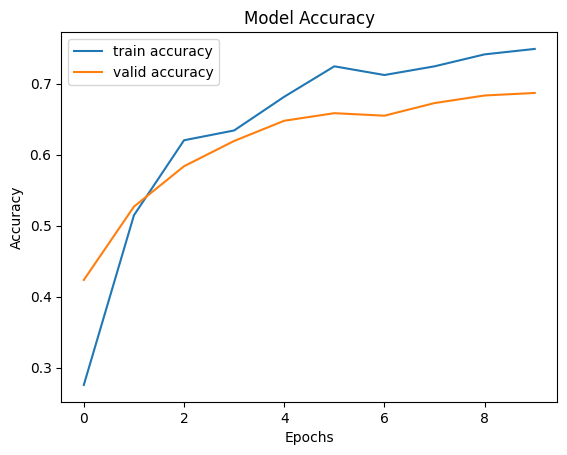

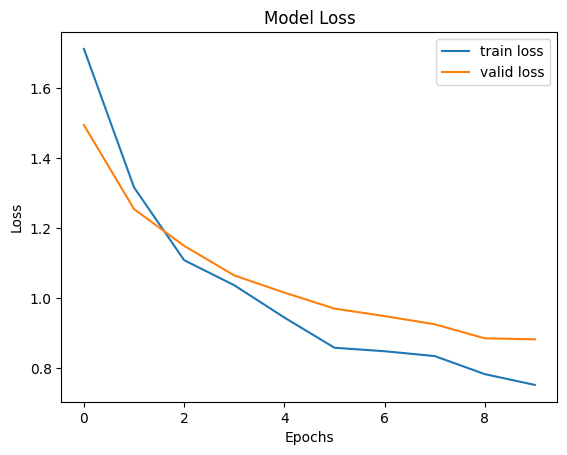

In [29]:
view_loss_accuracy(efficientnetb0_history_aug)

### 4.2 Transfer Learning Part 2: Fine-Tuning

Let's create a function that will plot the model loss curves and be able to see the before and after effect of fine-tuning a model.

In [30]:
# create a function that will be able to see the loss accuracy of a model after fine tuning
def view_loss_accuracy_finetuned(original_history, new_history, initial_epochs = 5):
  '''
  Compares the history of the models before and after fine tuning
  '''

  # get the original accuracy and loss for the train and val
  acc = original_history.history['accuracy']
  loss = original_history.history['loss']

  val_acc = original_history.history['val_accuracy']
  val_loss = original_history.history['val_loss']

  # get the new accuracy and loss for train and val after fine tuned
  total_acc = acc + new_history.history['accuracy']
  total_loss = loss + new_history.history['loss']

  total_val_acc = val_acc + new_history.history['val_accuracy']
  total_val_loss = val_loss + new_history.history['val_loss']

  # plot the original history
  plt.figure(figsize =(10, 10))
  plt.subplot(2, 1, 1)
  plt.plot(total_acc, label = 'Training Accuracy')
  plt.plot(total_val_acc, label = 'Validation Accuracy')
  plt.plot([initial_epochs - 1, initial_epochs - 1], plt.ylim(), label = 'Start Fine Tuning')
  plt.legend(loc = 'lower right')
  plt.title('Training and Validation Accuracy')

  plt.subplot(2, 1, 2)
  plt.plot(total_loss, label = 'Training Loss')
  plt.plot(total_val_loss, label = 'Validation Loss')
  plt.plot([initial_epochs - 1, initial_epochs - 1], plt.ylim(), label = 'Start Fine Tuning')
  plt.legend(loc = 'upper right')
  plt.title('Training and Validation Loss')

#### 4.2.1 Fine Tuning EfficientNet Feature Model

In [31]:
# get the layers of the efficientnet model
efficientnetb0_model_aug.layers

In [32]:
# are these layers trainable?
for layer in efficientnetb0_model_aug.layers:
  print(layer, layer.trainable)

<keras.src.engine.input_layer.InputLayer object at 0x0000020BB5FEC520> True
<keras.src.engine.sequential.Sequential object at 0x0000020BBA4EADC0> True
<keras.src.engine.functional.Functional object at 0x0000020BBA4B81F0> False
<keras.src.layers.pooling.global_average_pooling2d.GlobalAveragePooling2D object at 0x0000020BBA1BBFA0> True
<keras.src.layers.core.dense.Dense object at 0x0000020BBA5B7D00> True


In [33]:
# what layers are in our efficientnet model and are they trainable
for i, layer in enumerate(efficientnetb0_model_aug.layers[2].layers): # takes the layers of the functional layer (layer 2)
  print(i, layer.name, layer.trainable)

0 input_2 False
1 rescaling_2 False
2 normalization_1 False
3 rescaling_3 False
4 stem_conv_pad False
5 stem_conv False
6 stem_bn False
7 stem_activation False
8 block1a_dwconv False
9 block1a_bn False
10 block1a_activation False
11 block1a_se_squeeze False
12 block1a_se_reshape False
13 block1a_se_reduce False
14 block1a_se_expand False
15 block1a_se_excite False
16 block1a_project_conv False
17 block1a_project_bn False
18 block2a_expand_conv False
19 block2a_expand_bn False
20 block2a_expand_activation False
21 block2a_dwconv_pad False
22 block2a_dwconv False
23 block2a_bn False
24 block2a_activation False
25 block2a_se_squeeze False
26 block2a_se_reshape False
27 block2a_se_reduce False
28 block2a_se_expand False
29 block2a_se_excite False
30 block2a_project_conv False
31 block2a_project_bn False
32 block2b_expand_conv False
33 block2b_expand_bn False
34 block2b_expand_activation False
35 block2b_dwconv False
36 block2b_bn False
37 block2b_activation False
38 block2b_se_squeeze Fals

In [34]:
# how many trainable variables are there in our base model?
print(len(efficientnetb0_model_aug.layers[2].trainable_variables))

0


In [35]:
# to begin fine-tuning, let's start by setting the last 5 layers of the efficientnet model to true
efficientnetb0.trainable = True

# freeze all layers except for last 5
for layer in efficientnetb0.layers[:-5]:
  layer.trainable = False

# recompile our model everytime we make a change
efficientnetb0_model_aug.compile(loss = tf.keras.losses.CategoricalCrossentropy(),
                             optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),  # when fine-tuning, you typically lower the learning rate to 10x
                             metrics = ['accuracy'])

In [36]:
for layer_number, layer in enumerate(efficientnetb0_model_aug.layers[2].layers):
  print(layer_number, layer.name, layer.trainable)

0 input_2 False
1 rescaling_2 False
2 normalization_1 False
3 rescaling_3 False
4 stem_conv_pad False
5 stem_conv False
6 stem_bn False
7 stem_activation False
8 block1a_dwconv False
9 block1a_bn False
10 block1a_activation False
11 block1a_se_squeeze False
12 block1a_se_reshape False
13 block1a_se_reduce False
14 block1a_se_expand False
15 block1a_se_excite False
16 block1a_project_conv False
17 block1a_project_bn False
18 block2a_expand_conv False
19 block2a_expand_bn False
20 block2a_expand_activation False
21 block2a_dwconv_pad False
22 block2a_dwconv False
23 block2a_bn False
24 block2a_activation False
25 block2a_se_squeeze False
26 block2a_se_reshape False
27 block2a_se_reduce False
28 block2a_se_expand False
29 block2a_se_excite False
30 block2a_project_conv False
31 block2a_project_bn False
32 block2b_expand_conv False
33 block2b_expand_bn False
34 block2b_expand_activation False
35 block2b_dwconv False
36 block2b_bn False
37 block2b_activation False
38 block2b_se_squeeze Fals

In [37]:
print(len(efficientnetb0_model_aug.trainable_variables))

8


In [38]:
# fine tune for another 5 epochs
initial_epochs = 10
fine_tune_epochs = initial_epochs + 5

# refit the model except with more trainable parameters
efficientnetb0_history_aug_fine_tuned = efficientnetb0_model_aug.fit(train_data,
                                                                     epochs = fine_tune_epochs,
                                                                     validation_data = valid_data,
                                                                     initial_epoch = efficientnetb0_history_aug.epoch[-1], # takes the previous epoch of the previous model e.g. epoch 10 and continues from there
                                                                     callbacks = [create_callbacks(dir_name = 'tensorflow_hub',
                                                                                                   experiment_name = 'efficientnetb0_fine_tuned_feature_model')])

Saving TensorBoard Log Files to: tensorflow_hub/efficientnetb0_fine_tuned_feature_model/20241001-063707
Epoch 10/15
21/21 [==============================] - 78s 3s/step - loss: 0.7366 - accuracy: 0.7335 - val_loss: 0.8543 - val_accuracy: 0.6868 - lr: 1.0000e-04
Epoch 11/15
21/21 [==============================] - 58s 3s/step - loss: 0.6991 - accuracy: 0.7764 - val_loss: 0.8216 - val_accuracy: 0.6940 - lr: 9.0484e-05
Epoch 12/15
21/21 [==============================] - 58s 3s/step - loss: 0.6237 - accuracy: 0.7963 - val_loss: 0.8019 - val_accuracy: 0.6975 - lr: 8.1873e-05
Epoch 13/15
21/21 [==============================] - 58s 3s/step - loss: 0.6090 - accuracy: 0.7902 - val_loss: 0.8032 - val_accuracy: 0.7011 - lr: 7.4082e-05
Epoch 14/15
21/21 [==============================] - 54s 3s/step - loss: 0.5586 - accuracy: 0.8132 - val_loss: 0.7721 - val_accuracy: 0.7189 - lr: 6.7032e-05
Epoch 15/15
21/21 [==============================] - 54s 3s/step - loss: 0.5548 - accuracy: 0.8070 - val_l

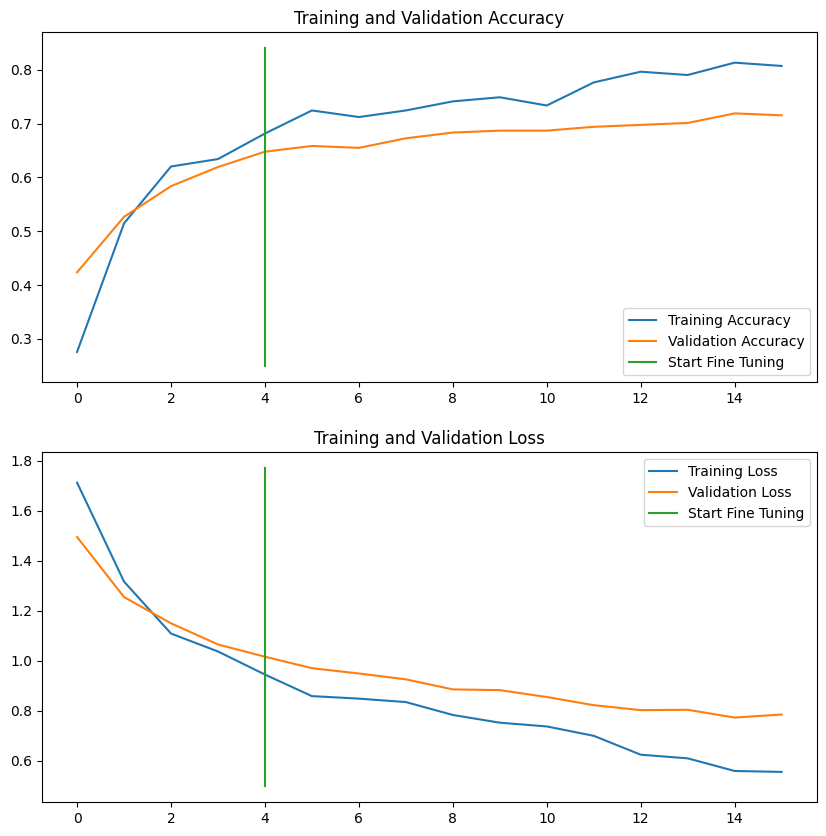

In [39]:
view_loss_accuracy_finetuned(efficientnetb0_history_aug, efficientnetb0_history_aug_fine_tuned)

### 4.3 Evaluating our Fine Tuned Transfer Learning Models

#### 4.3.1 Evaluating & Making Predictions on our EfficientNetB0 Fine Tuned Model

In [40]:
efficientnetb0_model_results = efficientnetb0_model_aug.evaluate(valid_data)
efficientnetb0_model_results

9/9 [==============================] - 16s 2s/step - loss: 0.7842 - accuracy: 0.7153


[0.7842469811439514, 0.7153024673461914]

In [41]:
# make predictions with our model
pred_probs_efficientnetb0 = efficientnetb0_model_aug.predict(valid_data, verbose = 1)
pred_probs_efficientnetb0

9/9 [==============================] - 21s 2s/step


array([[6.0550612e-01, 8.4440823e-04, 5.1799655e-04, 1.3154856e-03,
        3.9161673e-01, 1.9921470e-04],
       [9.5799536e-01, 7.0049544e-04, 6.3407002e-04, 2.4353508e-02,
        1.5705422e-02, 6.1121112e-04],
       [5.8875358e-01, 6.0339435e-04, 1.2160215e-02, 3.6506347e-02,
        3.6082801e-01, 1.1483581e-03],
       ...,
       [3.7369120e-03, 7.0890635e-03, 6.6367403e-04, 1.1411718e-02,
        1.9967104e-03, 9.7510195e-01],
       [6.7416236e-02, 9.0043796e-03, 1.1173834e-02, 4.1106027e-02,
        2.8286522e-04, 8.7101662e-01],
       [6.7000645e-03, 1.9294249e-02, 3.2059287e-03, 4.5015258e-03,
        3.5511208e-04, 9.6594310e-01]], dtype=float32)

In [42]:
# how many predictions are there?
len(pred_probs_efficientnetb0)

281

In [43]:
# what is the shape of our predictions
pred_probs_efficientnetb0.shape

(281, 6)

In [44]:
# see the first 10 predictions
pred_probs_efficientnetb0[:10]

array([[6.05506122e-01, 8.44408234e-04, 5.17996552e-04, 1.31548557e-03,
        3.91616732e-01, 1.99214701e-04],
       [9.57995355e-01, 7.00495439e-04, 6.34070020e-04, 2.43535079e-02,
        1.57054216e-02, 6.11211115e-04],
       [5.88753581e-01, 6.03394350e-04, 1.21602146e-02, 3.65063474e-02,
        3.60828012e-01, 1.14835810e-03],
       [3.74873847e-01, 2.97028176e-03, 6.48182351e-03, 2.08903737e-02,
        5.90953410e-01, 3.83028924e-03],
       [8.41438532e-01, 6.11445634e-04, 6.66713016e-03, 6.41467646e-02,
        8.17447826e-02, 5.39137283e-03],
       [7.06176162e-01, 2.25881883e-03, 1.40001610e-01, 3.07088159e-02,
        1.20257974e-01, 5.96563914e-04],
       [5.92672467e-01, 1.63543858e-02, 2.28514820e-01, 1.18648380e-01,
        3.19563374e-02, 1.18535785e-02],
       [9.51234519e-01, 4.21070820e-03, 1.95480697e-02, 1.47260260e-02,
        9.60755348e-03, 6.73133414e-04],
       [6.67982578e-01, 1.14184767e-02, 1.83462024e-01, 1.01929277e-01,
        3.06048356e-02, 

In [45]:
# what does the first prediction probability look like
pred_probs_efficientnetb0[0], len(pred_probs_efficientnetb0[0]), sum(pred_probs_efficientnetb0[0])

(array([6.0550612e-01, 8.4440823e-04, 5.1799655e-04, 1.3154856e-03,
        3.9161673e-01, 1.9921470e-04], dtype=float32),
 6,
 0.9999999590509105)

Our model outputs a prediction probability array (with N number of variables, where N is the number of classes for each sample passed to the predict method.)

In [46]:
# we got one prediction probability per class, in my case there is 6 prediction probabilities
print(f'Number of prediction probabilities for sample 0: {len(pred_probs_efficientnetb0[0])}')
print(f'What prediction probability for sample 0 looks like:\n {pred_probs_efficientnetb0[0]}')
print(f'The class with the highest predicted probability by the model for our sample 0: {pred_probs_efficientnetb0[0].argmax()}')
print(f'The class name for our highest predicted probability by the model for our sample 0: {class_names[pred_probs_efficientnetb0[0].argmax()]}')

Number of prediction probabilities for sample 0: 6
What prediction probability for sample 0 looks like:
 [6.0550612e-01 8.4440823e-04 5.1799655e-04 1.3154856e-03 3.9161673e-01
 1.9921470e-04]
The class with the highest predicted probability by the model for our sample 0: 0
The class name for our highest predicted probability by the model for our sample 0: Bird dropping


In [47]:
# get the predicted classes of each label/sample
pred_classes_efficientnetb0 = pred_probs_efficientnetb0.argmax(axis = 1)
pred_classes_efficientnetb0, len(pred_classes_efficientnetb0)

(array([0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 1, 4, 0,
        0, 0, 0, 1, 5, 4, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0,
        1, 0, 4, 0, 4, 0, 0, 0, 0, 0, 4, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        4, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 4, 1, 4, 1, 4, 1, 0, 0,
        4, 0, 2, 2, 3, 2, 2, 1, 2, 2, 1, 4, 2, 2, 2, 2, 3, 1, 2, 2, 1, 2,
        2, 2, 1, 3, 2, 1, 1, 2, 2, 2, 2, 2, 2, 1, 2, 0, 3, 3, 3, 0, 3, 3,
        1, 0, 0, 3, 0, 3, 3, 3, 4, 3, 4, 4, 3, 0, 3, 3, 3, 0, 3, 3, 1, 2,
        3, 3, 0, 2, 0, 0, 0, 0, 3, 3, 0, 4, 4, 1, 4, 4, 4, 4, 4, 4, 0, 4,
        0, 4, 4, 1, 4, 1, 4, 4, 2, 4, 4, 4, 4, 4, 0, 4, 0, 1, 0, 0, 0, 4,
        4, 0, 0, 4, 2, 4, 4, 4, 4, 4, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 5, 5, 5, 4, 4, 5, 5, 5, 0, 5, 5, 5, 4, 5, 5, 5, 5, 5, 5, 5,
        4, 5, 5, 5, 5, 5, 4, 5, 5, 5, 5, 5, 5, 4, 5, 5, 5], dtype=int64),
 281)

Now there is a prediction array of all of our models predictions. Now let's evalaute it by comparing it to the actual labels from the valid data labels.

In [48]:
# to get our labels, let's unbatch the valid data
y_labels_efficientnetb0 = []

for images, labels in valid_data.unbatch():
  y_labels_efficientnetb0.append(labels.numpy().argmax())  # .numpy() converts the tensorspec() into a integer (0, 1, ...) and the argmax gets the index value instead of (0, 1, 0, 1,...)
y_labels_efficientnetb0[:10]

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [49]:
# how many y labels are there
len(y_labels_efficientnetb0)

281

#### 4.3.1.1 Creating a Confusion Matrix

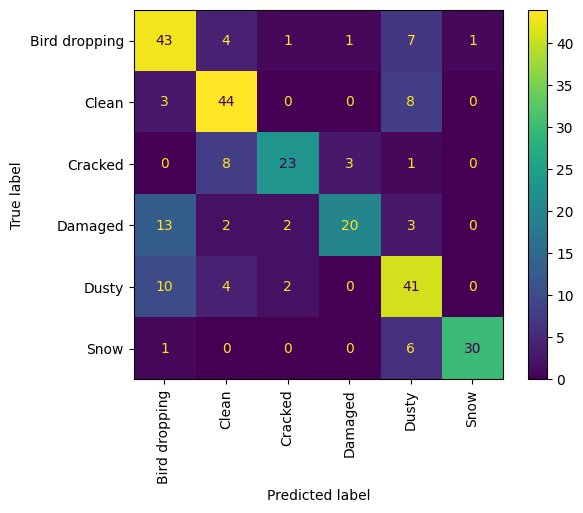

In [50]:
# get a confusion matrix to understand how our model generalizes against each class
from sklearn import metrics

confusion_matrix = metrics.confusion_matrix(y_true = y_labels_efficientnetb0, y_pred = pred_classes_efficientnetb0)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = class_names);
cm_display.plot(xticks_rotation = 90);

#### 4.3.1.2 Creating a classification report

In [51]:
# import the sklearn classification report
from sklearn.metrics import classification_report

print(classification_report(y_true = y_labels_efficientnetb0, y_pred = pred_classes_efficientnetb0, target_names = class_names))

               precision    recall  f1-score   support

Bird dropping       0.61      0.75      0.68        57
        Clean       0.71      0.80      0.75        55
      Cracked       0.82      0.66      0.73        35
      Damaged       0.83      0.50      0.62        40
        Dusty       0.62      0.72      0.67        57
         Snow       0.97      0.81      0.88        37

     accuracy                           0.72       281
    macro avg       0.76      0.71      0.72       281
 weighted avg       0.74      0.72      0.72       281



In [52]:
# get the dictionary format of the classification report
classification_report_dict = classification_report(y_true = y_labels_efficientnetb0, y_pred = pred_classes_efficientnetb0, target_names = class_names, output_dict = True)
classification_report_dict

{'Bird dropping': {'precision': 0.6142857142857143,
  'recall': 0.7543859649122807,
  'f1-score': 0.6771653543307087,
  'support': 57.0},
 'Clean': {'precision': 0.7096774193548387,
  'recall': 0.8,
  'f1-score': 0.7521367521367521,
  'support': 55.0},
 'Cracked': {'precision': 0.8214285714285714,
  'recall': 0.6571428571428571,
  'f1-score': 0.7301587301587301,
  'support': 35.0},
 'Damaged': {'precision': 0.8333333333333334,
  'recall': 0.5,
  'f1-score': 0.625,
  'support': 40.0},
 'Dusty': {'precision': 0.6212121212121212,
  'recall': 0.7192982456140351,
  'f1-score': 0.6666666666666666,
  'support': 57.0},
 'Snow': {'precision': 0.967741935483871,
  'recall': 0.8108108108108109,
  'f1-score': 0.8823529411764706,
  'support': 37.0},
 'accuracy': 0.7153024911032029,
 'macro avg': {'precision': 0.761279849183075,
  'recall': 0.7069396464133306,
  'f1-score': 0.7222467407448881,
  'support': 281.0},
 'weighted avg': {'precision': 0.7378840556374708,
  'recall': 0.7153024911032029,
  '

Let's plot all of our classes F1-Score

In [53]:
# create an emprt dictionary
class_f1_scores = {}

# loop through the classification dictionary items and store the f1-score
for class_key, class_value in classification_report_dict.items():   # get the key and values in the classification report dictionary

  if class_key == 'accuracy': # stop when reaching the accuracy keys
    break

  else:
    # add class names and f1-scores to the new dictionary
    class_f1_scores[class_key] = class_value['f1-score']

class_f1_scores

{'Bird dropping': 0.6771653543307087,
 'Clean': 0.7521367521367521,
 'Cracked': 0.7301587301587301,
 'Damaged': 0.625,
 'Dusty': 0.6666666666666666,
 'Snow': 0.8823529411764706}

In [54]:
# turn the class f1 scores into a dataframe
class_f1_scores = pd.DataFrame({'Class Names' : list(class_f1_scores.keys()),
                                'F1-Scores' : list(class_f1_scores.values())}).sort_values('F1-Scores', ascending = False)
class_f1_scores

,Class Names,F1-Scores
5,Snow,0.882353
1,Clean,0.752137
2,Cracked,0.730159
0,Bird dropping,0.677165
4,Dusty,0.666667
3,Damaged,0.625000


LET'S VISUALIZE IT!!!

C:\Users\Emad\AppData\Local\Temp\ipykernel_11896\3032266469.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(class_f1_scores['Class Names']);


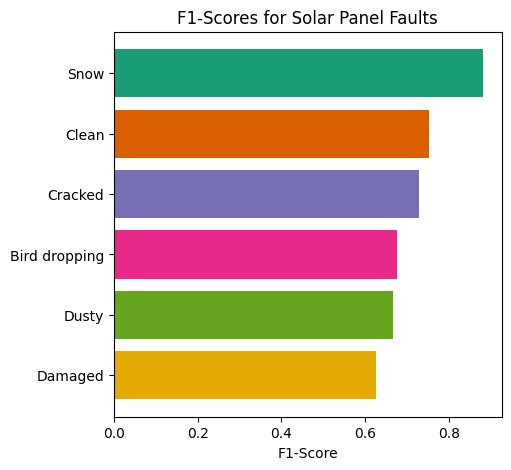

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(figsize = (5, 5));

scores = ax.barh(range(len(class_f1_scores)), class_f1_scores['F1-Scores'].values, label = class_f1_scores['Class Names'], color = sns.palettes.mpl_palette('Dark2'));
ax.set_yticklabels(class_f1_scores['Class Names']);
ax.set_yticks(range(len(class_f1_scores)));
ax.set_xlabel('F1-Score');
ax.set_title('F1-Scores for Solar Panel Faults');
ax.invert_yaxis();  # reverse the order of the classes from ascending to descending

#### 4.3.1.3 Visualzing & Making Prediction on our test images and evaluating them

In [56]:
# create a function to load and prepare images
def load_and_pred_image(filename, img_shape = (224), scale = True):
  '''
  Reads in an image from filename, turns it into a tensor, and reshapes it into the specified image shape of (224, 224, 3)

  Args:

  filename (str) : path to target image
  image_shape (int) : height/width dimension of target image size
  scale (bool) : scale pixel values from 0-255 to 0-1 or not.

  Returns:
  Image tensor of shape (224, 224, 3)
  '''

  # read in the target image
  img = tf.io.read_file(filename)

  # decode the image into a tensor
  img = tf.io.decode_image(img, channels = 3)

  # resize the image to the appropriate image size
  img = tf.image.resize(img, [img_shape, img_shape])

  # scale?
  if scale:
    return img / 255.

  else:
    return img

1/1 [==============================] - 0s 126ms/step


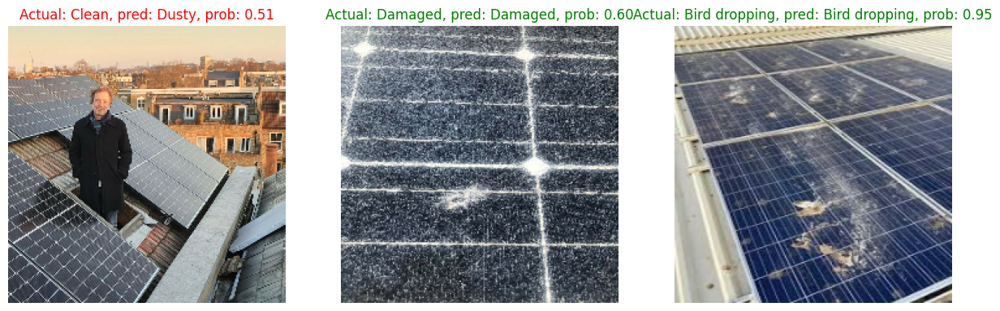

In [57]:
# make preds on a series of test images
import os
import random

# setup figure
plt.figure(figsize = (15, 15))

for i in range(3):
  # choose a random image from a random class
  class_name = random.choice(class_names)

  # get a random file name from the class name
  filename = random.choice(os.listdir('data_splitted/val' + '/' + class_name))  # gets the filename of the random class

  # create a filepath
  filepath = 'data_splitted/val' + '/' + class_name + '/' + filename

  # load and prepare the filename using load and prepare function
  img = load_and_pred_image(filename = filepath, scale = False)

  # predict on the image using efficinetnetb0
  img_expanded = tf.expand_dims(img, axis = 0)  # expand the image to be (batch_size, 224, 224, 3) as the model is expecting and was trained on this format
  pred_prob = efficientnetb0_model_aug.predict(img_expanded) # get prediction probability
  pred_class = class_names[pred_prob.argmax()]  # get the highest prediction index and get the associated predicted class

  # visualize the prediction and compare it against the true labels
  plt.subplot(1, 3, i + 1)
  plt.imshow(img / 255.)

  if class_name == pred_class:  # if the random class name is equal to the predicted class, make text green
    title_color = 'g'
  else:
    title_color = 'r'

  plt.title(f'Actual: {class_name}, pred: {pred_class}, prob: {pred_prob.max():.2f}', c = title_color)
  plt.axis(False);

#### 4.3.1.4 Finding our Model's Most Wronged Predictions

In [58]:
# 1. Get all of the image filepaths in the valid dataset
filepaths =[]

for filepath in valid_data.list_files('data_splitted/val/*/*.jpg', shuffle = True):

  filepaths.append(filepath.numpy())
filepaths[:10]

[b'data_splitted\\val\\Dusty\\dusty (24).jpg',
 b'data_splitted\\val\\Damaged\\damged (99).jpg',
 b'data_splitted\\val\\Bird dropping\\bird (92).jpg',
 b'data_splitted\\val\\Dusty\\dusty (91).jpg',
 b'data_splitted\\val\\Bird dropping\\bird (151).jpg',
 b'data_splitted\\val\\Snow\\snow (69).jpg',
 b'data_splitted\\val\\Clean\\clean (31).jpg',
 b'data_splitted\\val\\Snow\\snow (123).jpg',
 b'data_splitted\\val\\Clean\\clean (91).jpg',
 b'data_splitted\\val\\Bird dropping\\bird (122).jpg']

In [59]:
# 2. Create a dataframe of different parameters for each of our test/valid images
import pandas as pd
pred_df = pd.DataFrame({'img path' : filepaths,
                        'y_true' : y_labels_efficientnetb0,
                        'y_pred' : pred_classes_efficientnetb0,
                        'pred_conf' : pred_probs_efficientnetb0.max(axis = 1),  # get the maximum predicted probability
                        'y_true_class_name' : [class_names[i] for i in y_labels_efficientnetb0],
                        'y_pred_class_name' : [class_names[i] for i in pred_classes_efficientnetb0]})
pred_df[:10]

,img path,y_true,y_pred,pred_conf,y_true_class_name,y_pred_class_name
0,b'data_splitted\\val\\Dusty\\dusty (24).jpg',0,0,0.605506,Bird dropping,Bird dropping
1,b'data_splitted\\val\\Damaged\\damged (99).jpg',0,0,0.957995,Bird dropping,Bird dropping
2,b'data_splitted\\val\\Bird dropping\\bird (92)...,0,0,0.588754,Bird dropping,Bird dropping
3,b'data_splitted\\val\\Dusty\\dusty (91).jpg',0,4,0.590953,Bird dropping,Dusty
4,b'data_splitted\\val\\Bird dropping\\bird (151...,0,0,0.841439,Bird dropping,Bird dropping
5,b'data_splitted\\val\\Snow\\snow (69).jpg',0,0,0.706176,Bird dropping,Bird dropping
6,b'data_splitted\\val\\Clean\\clean (31).jpg',0,0,0.592672,Bird dropping,Bird dropping
7,b'data_splitted\\val\\Snow\\snow (123).jpg',0,0,0.951235,Bird dropping,Bird dropping
8,b'data_splitted\\val\\Clean\\clean (91).jpg',0,0,0.667983,Bird dropping,Bird dropping
9,b'data_splitted\\val\\Bird dropping\\bird (122...,0,0,0.399123,Bird dropping,Bird dropping


In [60]:
# 3. Find out in our dataframe which predictions are wrong
pred_df['pred_correct'] = pred_df['y_true'] == pred_df['y_pred']
pred_df.head()

,img path,y_true,y_pred,pred_conf,y_true_class_name,y_pred_class_name,pred_correct
0,b'data_splitted\\val\\Dusty\\dusty (24).jpg',0,0,0.605506,Bird dropping,Bird dropping,True
1,b'data_splitted\\val\\Damaged\\damged (99).jpg',0,0,0.957995,Bird dropping,Bird dropping,True
2,b'data_splitted\\val\\Bird dropping\\bird (92)...,0,0,0.588754,Bird dropping,Bird dropping,True
3,b'data_splitted\\val\\Dusty\\dusty (91).jpg',0,4,0.590953,Bird dropping,Dusty,False
4,b'data_splitted\\val\\Bird dropping\\bird (151...,0,0,0.841439,Bird dropping,Bird dropping,True


In [61]:
# 4. Sort our dataframe to have the most wrong predictions at the top
top_wrong_predictions = pred_df[pred_df['pred_correct'] == False].sort_values('pred_conf', ascending = False)
top_wrong_predictions

,img path,y_true,y_pred,pred_conf,y_true_class_name,y_pred_class_name,pred_correct
26,b'data_splitted\\val\\Cracked\\cracked (47).jpg',0,5,0.977071,Bird dropping,Snow,False
54,b'data_splitted\\val\\Snow\\snow (117).jpg',0,4,0.965637,Bird dropping,Dusty,False
151,b'data_splitted\\val\\Dusty\\dusty (78).jpg',3,0,0.962877,Damaged,Bird dropping,False
48,b'data_splitted\\val\\Bird dropping\\bird (114...,0,4,0.926147,Bird dropping,Dusty,False
178,b'data_splitted\\val\\Clean\\clean (21).jpg',3,0,0.909737,Damaged,Bird dropping,False
...,...,...,...,...,...,...,...
264,b'data_splitted\\val\\Cracked\\cracked (93).jpg',5,4,0.332066,Snow,Dusty,False
138,b'data_splitted\\val\\Cracked\\cracked (87).jpg',2,1,0.307849,Cracked,Clean,False
206,b'data_splitted\\val\\Dusty\\dusty (90).jpg',4,2,0.304294,Dusty,Cracked,False
154,b'data_splitted\\val\\Bird dropping\\bird (182...,3,1,0.288722,Damaged,Clean,False


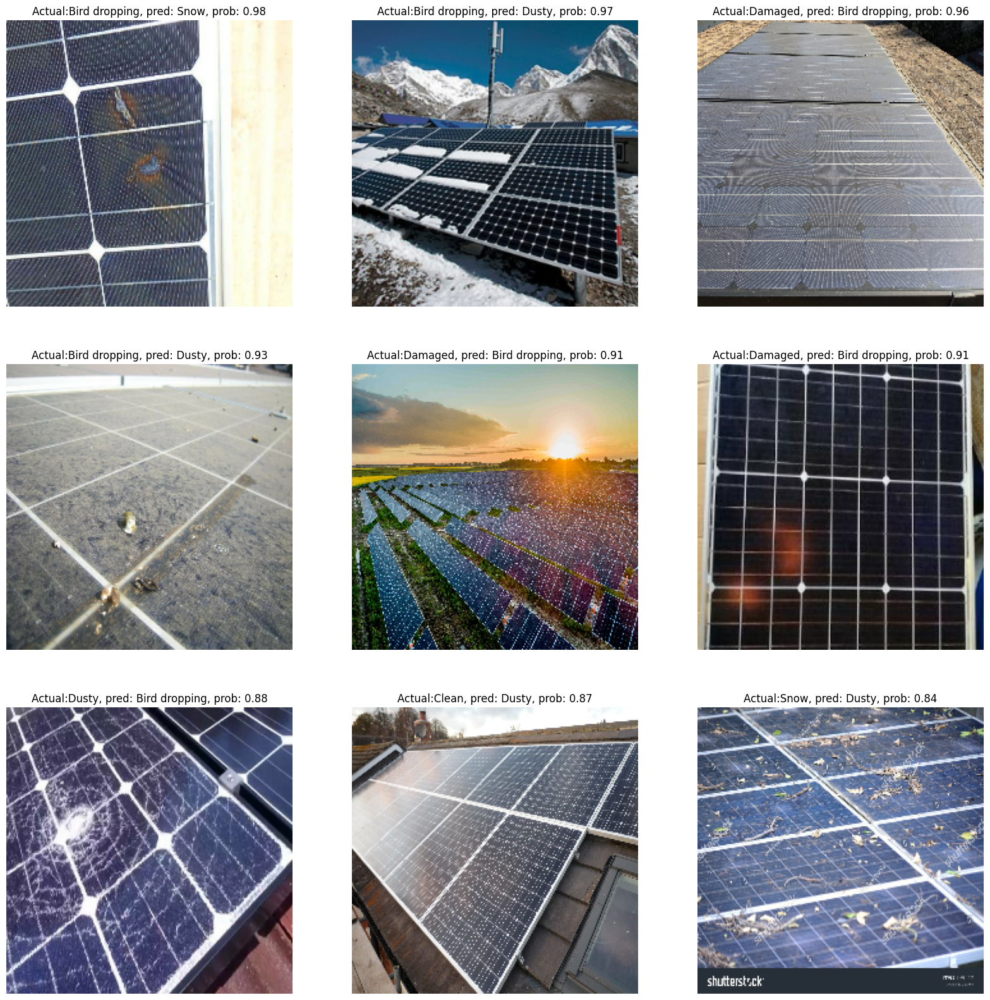

In [62]:
# 5. Visualize the data samples with the most wrong predictions but with the highest prediction probability
plt.figure(figsize = (20, 20))

images_to_view = 9
start_index = 0

for i, row in enumerate(top_wrong_predictions[start_index : start_index + images_to_view].itertuples()): # from index 0 to the index 0 + 9 images. intertuples gets the values altogether
  plt.subplot(3, 3, i + 1)
  img = load_and_pred_image(row[1], scale = False)  # row[1] gets the filepath of the top_wrong_predictions dataframe

  _, _, _, _, pred_prob, y_true_class_name,  y_pred_class_name, _ = row # only interested in a few parameters in each row
  plt.imshow(img / 255.)
  plt.title(f'Actual:{y_true_class_name}, pred: {y_pred_class_name}, prob: {pred_prob:.2f}')
  plt.axis(False)

#### 4.3.1.5 Test out the model on our own custom image

1/1 [==============================] - 0s 107ms/step


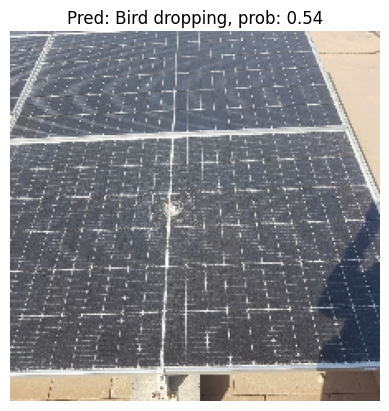

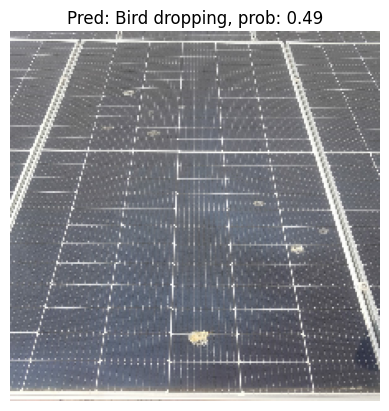

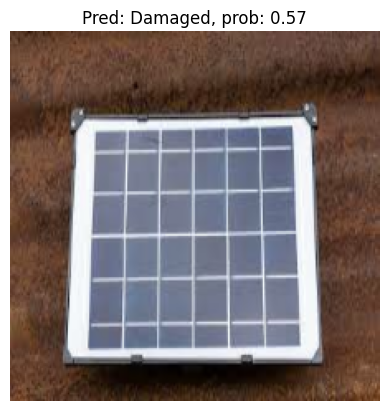

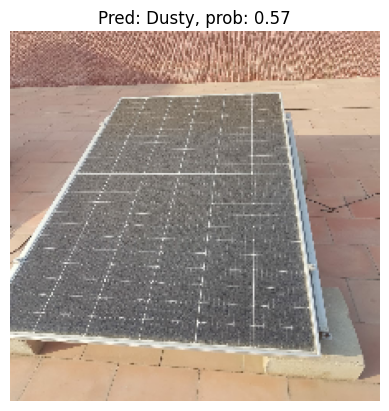

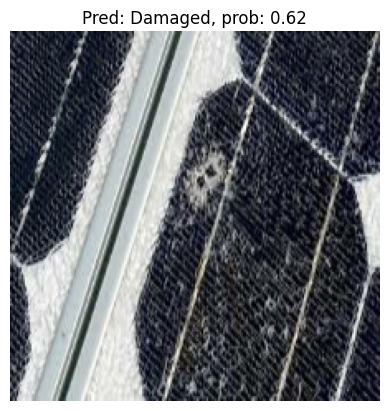

In [63]:
import requests
# get the custom image folder from github and download it
damaged = 'https://github.com/Ahmed-Sohail2000/Solar-Eye-Project/blob/main/Custom%20Images/akuh%20damaged.jpeg?raw=true'
bird_dropping = 'https://github.com/Ahmed-Sohail2000/Solar-Eye-Project/blob/main/Custom%20Images/bird%20dropping%20akuh.jpeg?raw=true'
clean = 'https://github.com/Ahmed-Sohail2000/Solar-Eye-Project/blob/main/Custom%20Images/single%20panel%20clean.jpeg?raw=true'
dusty = 'https://github.com/Ahmed-Sohail2000/Solar-Eye-Project/blob/main/Custom%20Images/AKUH%20dust%20panel.jpeg?raw=true'
cracked = 'https://github.com/Ahmed-Sohail2000/Solar-Eye-Project/blob/main/Custom%20Images/crack%20solar%20panel.jpeg?raw=true'

custom_images = [damaged, bird_dropping, clean, dusty, cracked]

# Function to download image from URL
def download_image(url, filename):
    response = requests.get(url)
    if response.status_code == 200:
        with open(filename, 'wb') as f:
            f.write(response.content)
    else:
        print(f"Failed to download image from {url}")

# Download and save each custom image
filenames = []
for i, img_url in enumerate(custom_images):
    filename = f"custom_image_{i}.jpeg"
    download_image(img_url, filename)
    filenames.append(filename)

# Loop through the downloaded images, load them, and make predictions
for filename in filenames:
    img = load_and_pred_image(filename, scale=False)
    pred_prob = efficientnetb0_model_aug.predict(tf.expand_dims(img, axis=0))
    pred_classes = class_names[pred_prob.argmax()]

    # Plot the images
    plt.figure()
    plt.imshow(img / 255.)
    plt.title(f'Pred: {pred_classes}, prob: {pred_prob.max():.2f}')
    plt.axis(False)


### 4.4 Saving & Loading our CNN Model

In [65]:
# save a model
efficientnetb0_model_aug.save('efficientnetb0_model_augmented')
# حفظ النموذج بصيغة .keras
efficientnetb0_model_aug.save('efficientnetb0_model_augmented.keras')


INFO:tensorflow:Assets written to: efficientnetb0_model_augmented\assets


INFO:tensorflow:Assets written to: efficientnetb0_model_augmented\assets
